## Predictive Maintenance Example: Machine Learning Modeling, Stepwise Linear Regression
#### Supplement to 'Operationalizing Predictive Maintenance on a Distributed Network of Equipment'
###### Melissa Perry
###### UWEX Data Science Masters Program Capstone
###### December 12, 2021

In [1]:
# EXECUTE FIRST

# computational imports
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, RandomizedSearchCV
import xgboost as xgb
from scipy.stats import uniform, randint
from GPyOpt.methods import BayesianOptimization
from tpot import TPOTRegressor
from pprint import pprint

# plotting imports
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")

# for reading files from urls
import urllib.request
# display imports
from IPython.display import display, IFrame
from IPython.core.display import HTML

# # import notebook styling for tables and width etc.
# response = urllib.request.urlopen('https://raw.githubusercontent.com/DataScienceUWL/DS775v2/master/ds755.css')
# HTML(response.read().decode("utf-8"));

# import warnings
import warnings

In [2]:
# define filepath to read data
dir_path = './data/'

# define column names for easy indexing
index_names = ['unit_number', 'time_in_cycles']
setting_names = ['setting_1', 'setting_2', 'setting_3']
sensor_names = ['T2','T24','T30','T50','P2','P15','P30','Nf','Nc','epr','Ps30','phi','NRf','NRc','BPR','farB','htBleed','Nf_dmd','PCNfR_dmd','W31','W32']
col_names = index_names + setting_names + sensor_names

# read data
train = pd.read_csv((dir_path+'train_FD001.txt'), sep='\s+', header=None, names=col_names)
test = pd.read_csv((dir_path+'test_FD001.txt'), sep='\s+', header=None, names=col_names)
y_test = pd.read_csv((dir_path+'RUL_FD001.txt'), sep='\s+', header=None, names=['RUL'])

train.head()

,unit_number,time_in_cycles,setting_1,setting_2,setting_3,T2,T24,T30,T50,P2,...,phi,NRf,NRc,BPR,farB,htBleed,Nf_dmd,PCNfR_dmd,W31,W32
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [3]:
def add_remaining_useful_life(df):
    # Get the total number of cycles for each unit
    grouped_by_unit = df.groupby(by="unit_number")
    max_cycle = grouped_by_unit["time_in_cycles"].max()
    
    # Merge the max cycle back into the original frame
    result_frame = df.merge(max_cycle.to_frame(name='max_cycle'), left_on='unit_number', right_index=True)
    
    # Calculate remaining useful life for each row
    remaining_useful_life = result_frame["max_cycle"] - result_frame["time_in_cycles"]
    result_frame["RUL"] = remaining_useful_life
    
    # drop max_cycle as it's no longer needed
    result_frame = result_frame.drop("max_cycle", axis=1)
    return result_frame

train = add_remaining_useful_life(train)
train[index_names+['RUL']].head()

,unit_number,time_in_cycles,RUL
0,1,1,191
1,1,2,190
2,1,3,189
3,1,4,188
4,1,5,187


In [4]:
#take the difference of variables from their demanded levels. 
train['Nf_diff']=train['Nf']-train['Nf_dmd']
train['NRf_diff'] = train['NRf']-train['PCNfR_dmd']
test['Nf_diff']=test['Nf']-test['Nf_dmd']
test['NRf_diff'] = test['NRf']-test['PCNfR_dmd']

# drop unwanted columns and split target variable from training set
drop_sensors = ['T2', 'P2','epr','farB','Nf_dmd','PCNfR_dmd','Nc','Nf','NRf','P15'] # observe rationale in Predictive Maintenance EDA and Feature Engineering file, where these variables produce no additional data.  
drop_labels = index_names+setting_names+drop_sensors

X_train = train.drop(drop_labels, axis=1)
y_train = X_train.pop('RUL')
remaining_sensors = X_train.columns.difference(index_names+['RUL'])

# Since the true RUL values for the test set are only provided for the last time cycle of each enginge, 
# the test set is subsetted to represent the same
X_test = test.groupby('unit_number').last().reset_index().drop(drop_labels, axis=1)


print(X_train.columns)  # check remaining columns

Index(['T24', 'T30', 'T50', 'P30', 'Ps30', 'phi', 'NRc', 'BPR', 'htBleed',
       'W31', 'W32', 'Nf_diff', 'NRf_diff'],
      dtype='object')


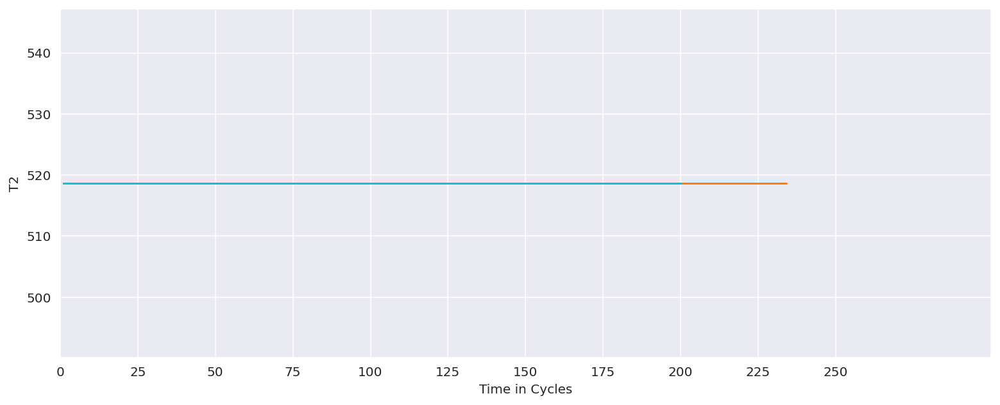

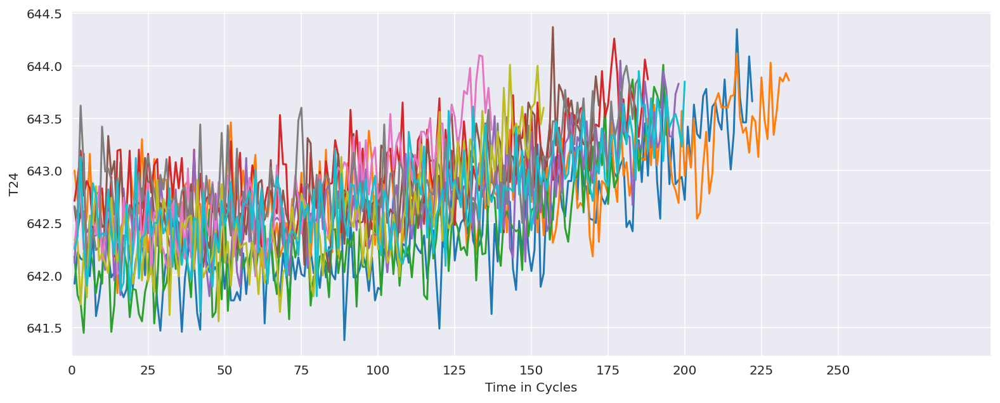

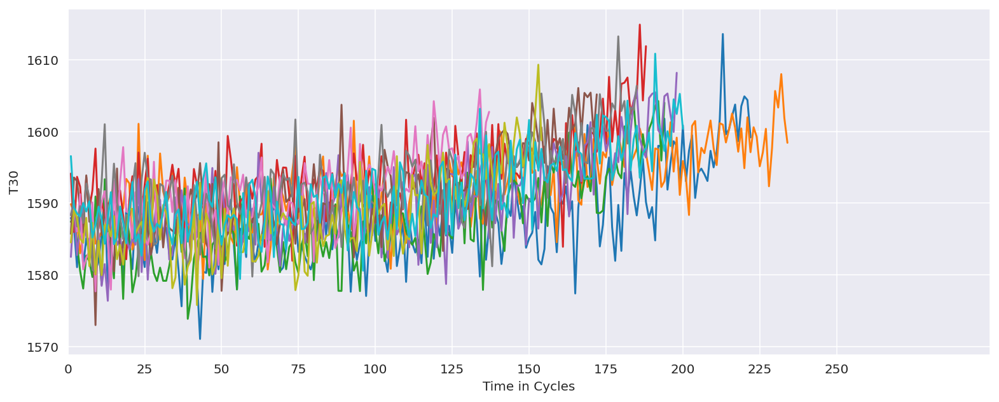

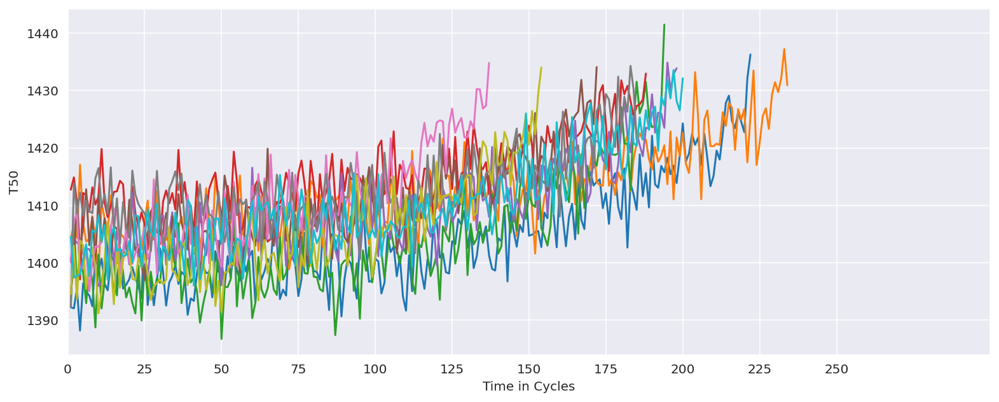

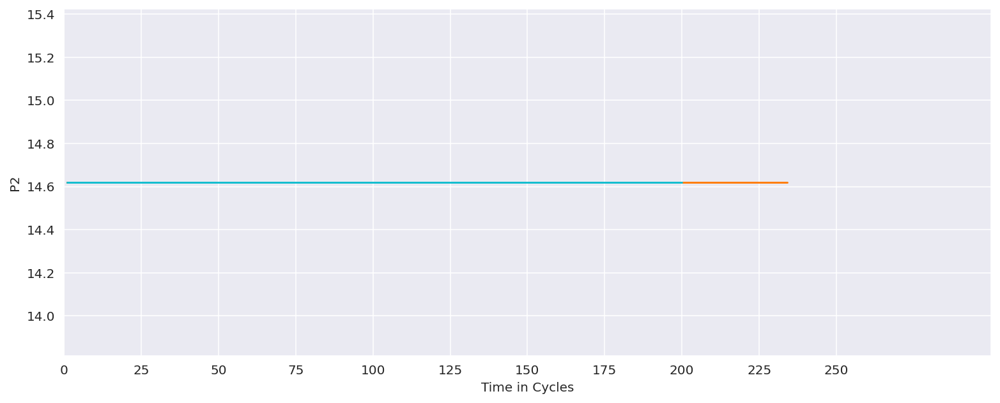

...

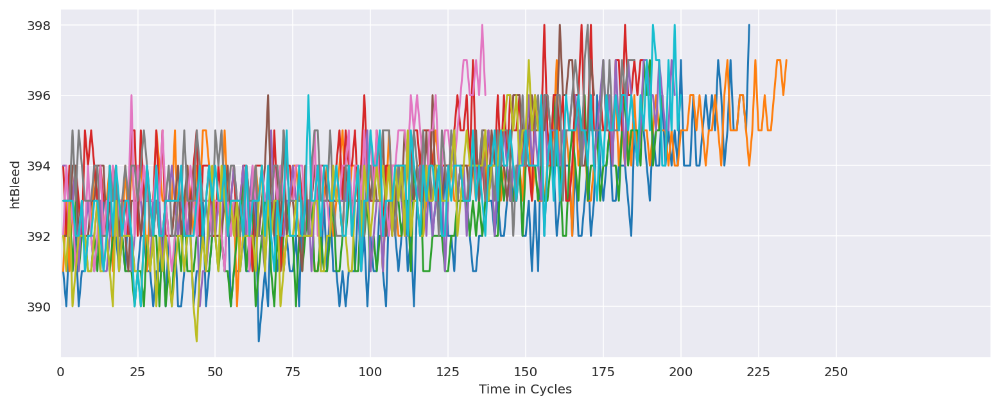

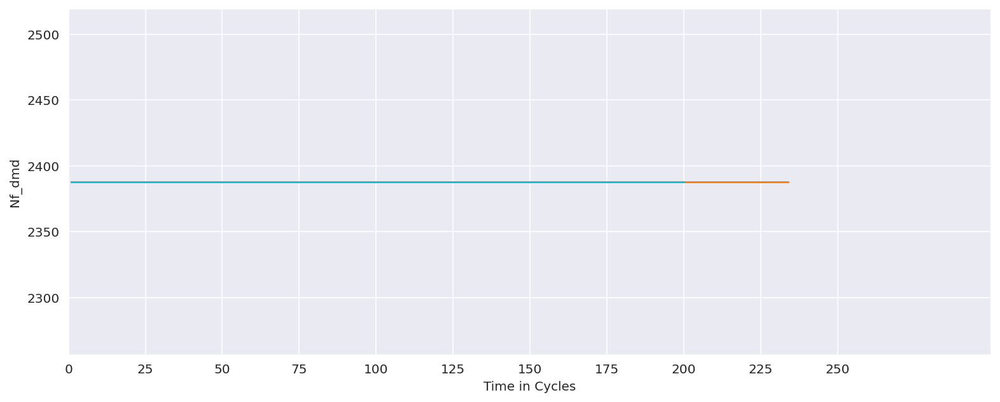

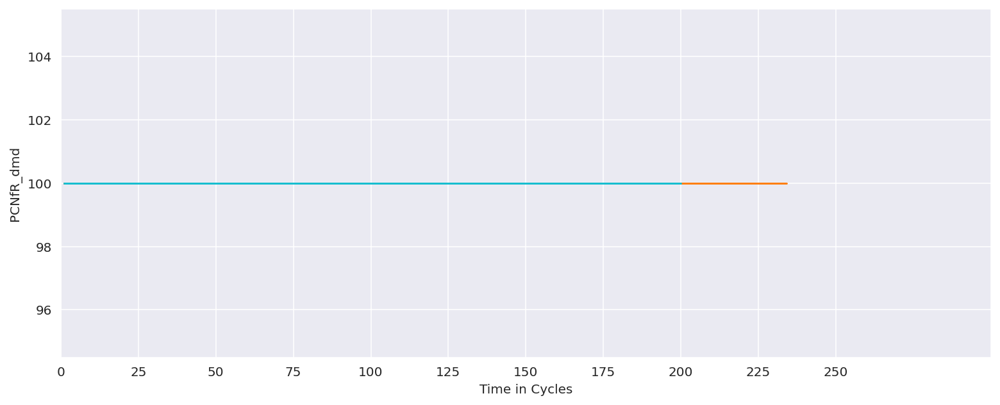

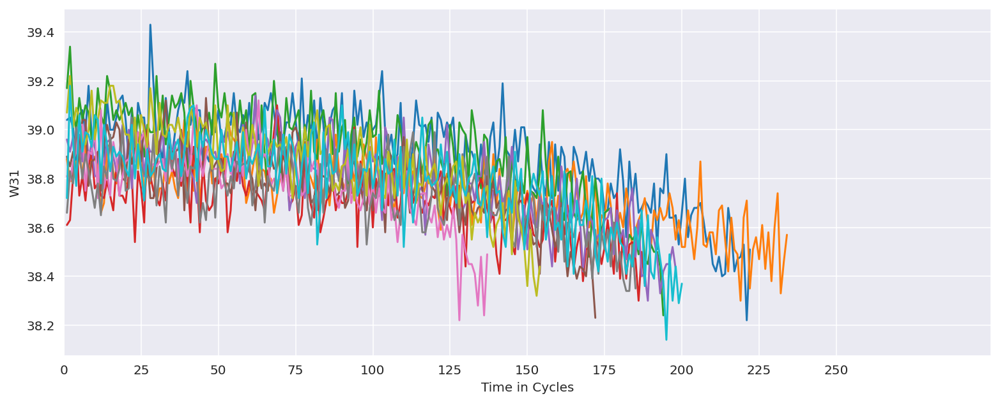

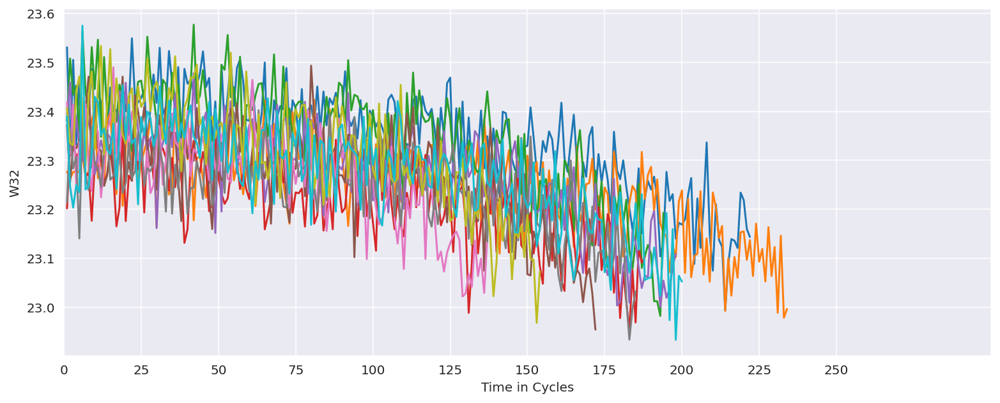

In [5]:
def plot_sensor(sensor_name):
    plt.figure(figsize=(13,5))
    for i in train['unit_number'].unique():
        if (i % 10 == 0):  # only plot every 10th unit_nr
            plt.plot('time_in_cycles', sensor_name, 
                     data=train[train['unit_number']==i])
    plt.xlim(0, 300) 
    plt.xticks(np.arange(0, 275, 25))
    plt.ylabel(sensor_name)
    plt.xlabel('Time in Cycles')
    plt.show()

for sensor_name in sensor_names:
    plot_sensor(sensor_name)

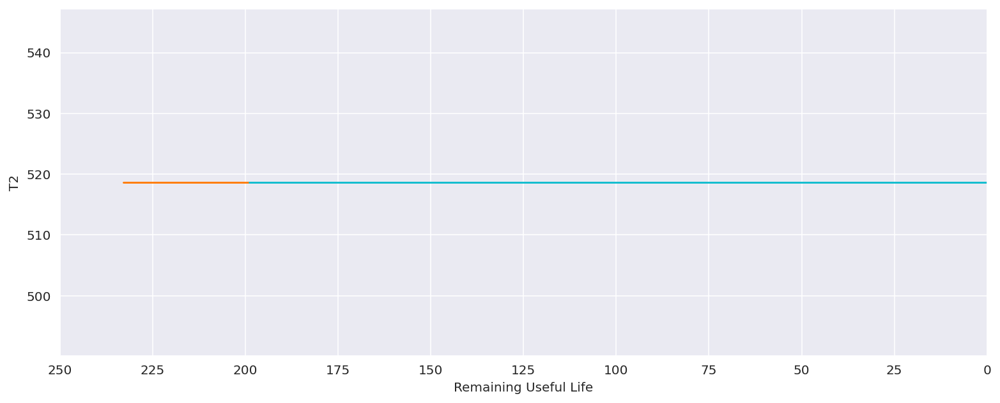

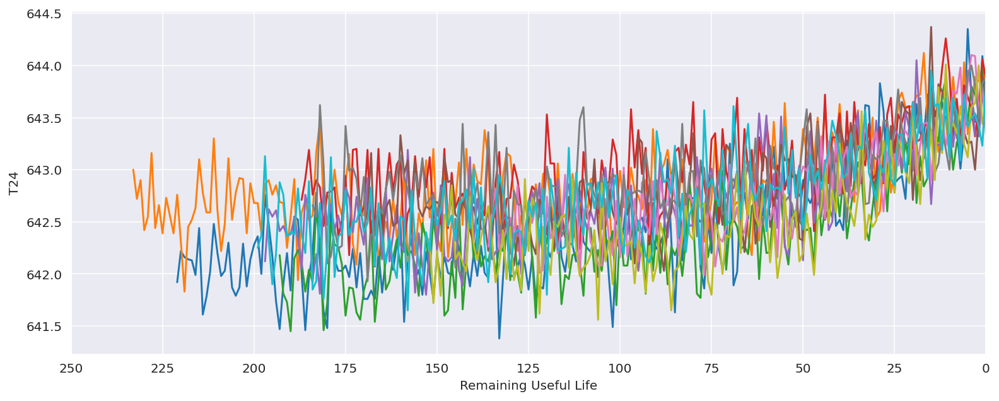

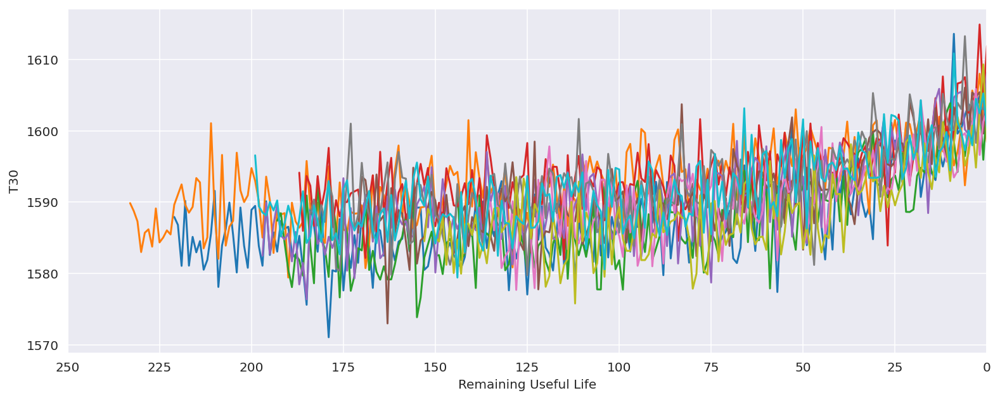

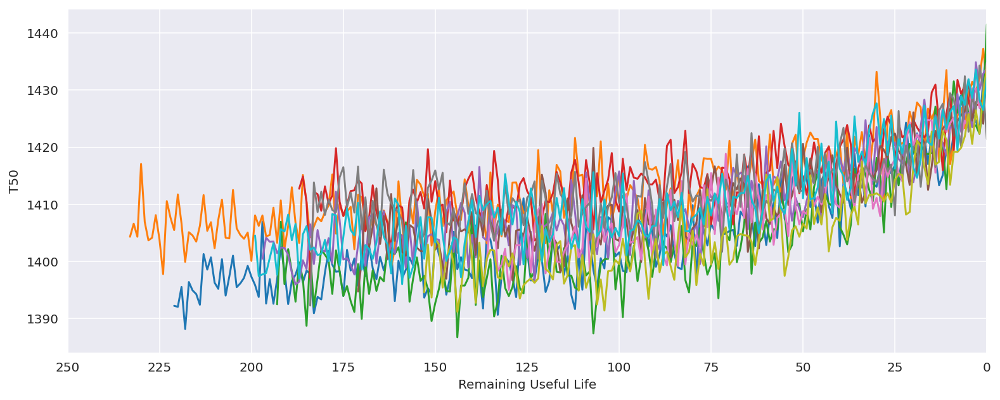

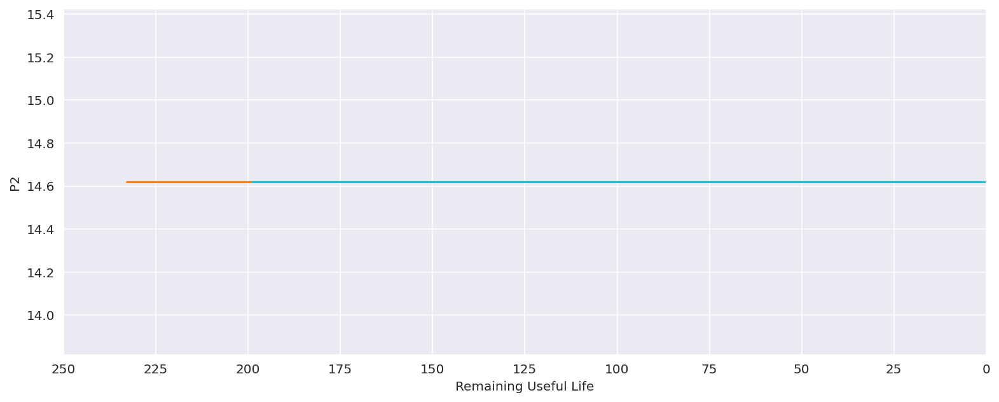

...

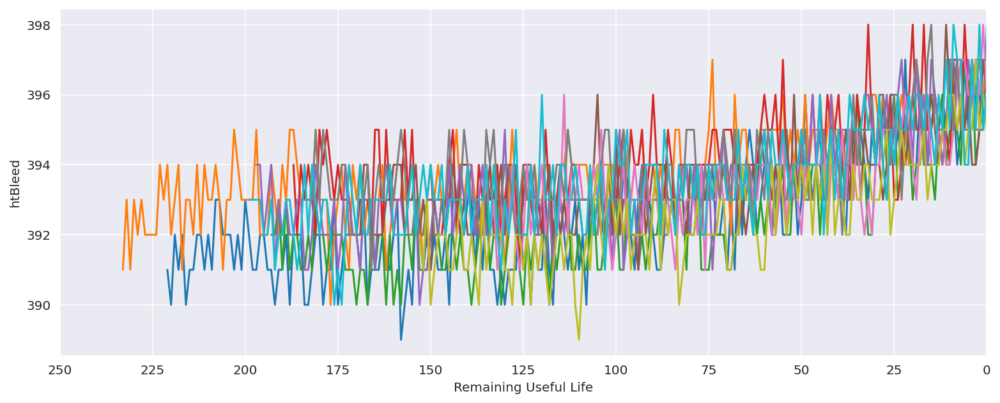

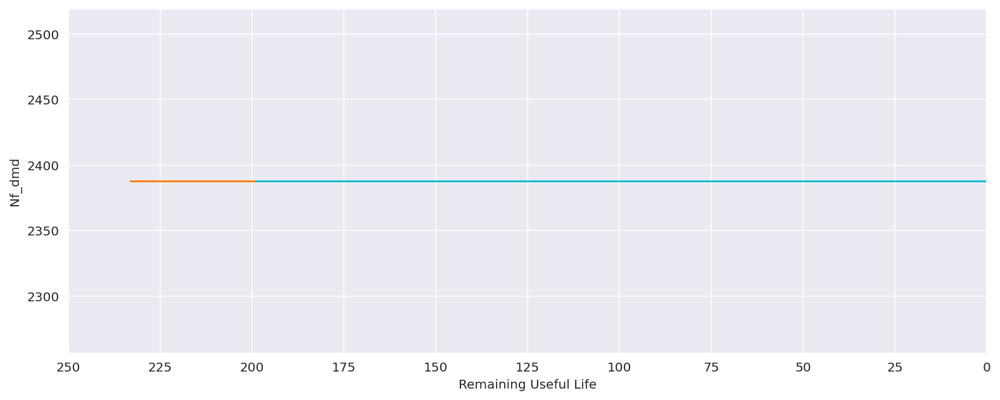

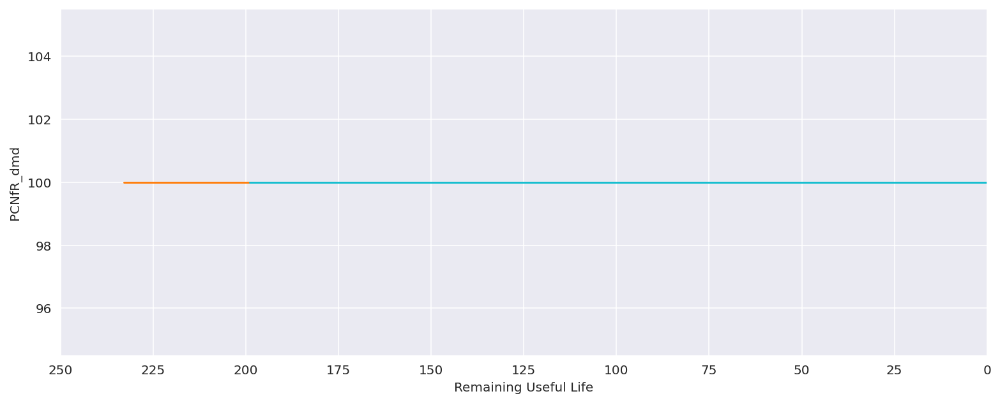

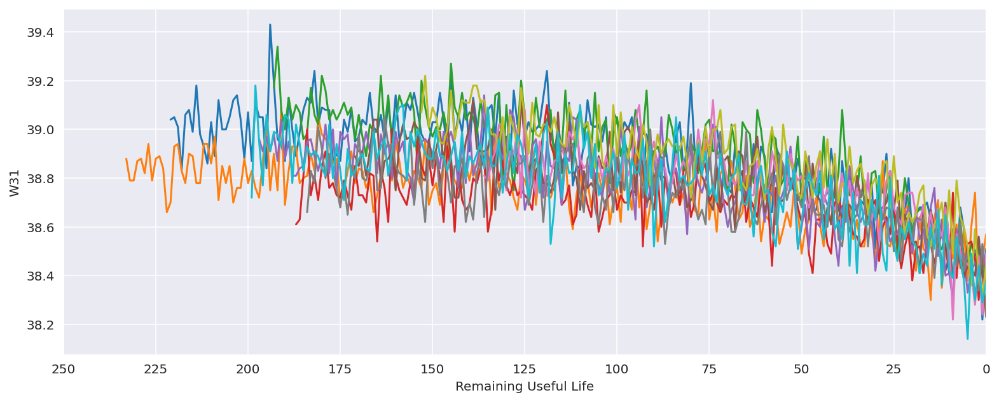

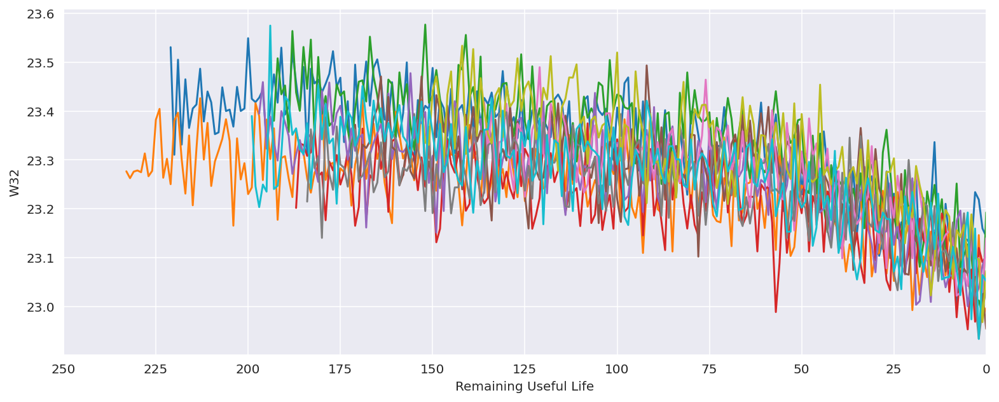

In [6]:
def plot_sensor(sensor_name):
    plt.figure(figsize=(13,5))
    for i in train['unit_number'].unique():
        if (i % 10 == 0):  # only plot every 10th unit_nr
            plt.plot('RUL', sensor_name, 
                     data=train[train['unit_number']==i])
    plt.xlim(250, 0)  # reverse the x-axis so RUL counts down to zero
    plt.xticks(np.arange(0, 275, 25))
    plt.ylabel(sensor_name)
    plt.xlabel('Remaining Useful Life')
    plt.show()

for sensor_name in sensor_names:
    plot_sensor(sensor_name)

### Baseline models

In [7]:
# Step 1: import the model
# from sklearn.linear_model import LinearRegression

# Step 2: create a model object (hyperparameters are declared here, we are using default values) 
model_lr = LinearRegression()

# Step 3: fit the model by calling its fit() method
model_lr.fit(X_train, y_train)

LinearRegression()

In [8]:
score_training = model_lr.score(X_train,y_train)
print(f"Model r-squared score from training data {score_training:.4f}")

Model r-squared score from training data 0.5787


In [9]:
# Step 4 - assess model quality on test data
score_test = model_lr.score(X_test,y_test)
print(f"Model r-squared score from test data: {score_test:.4f}")

Model r-squared score from test data: 0.4182


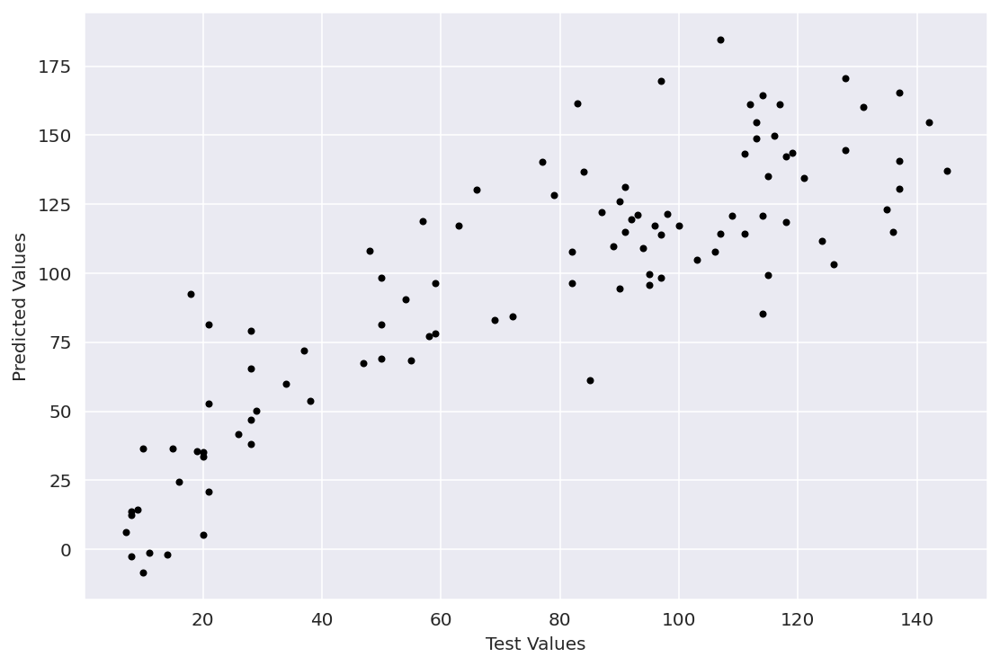

In [10]:
# Step 5 - make predictions
y_pred = model_lr.predict(X_test)

# The plot is optional, but it gives an idea of the model accuracy, 
# in a perfect model the points would line up along the diagonal (y=x)
# import matplotlib.pyplot as plt
plt.figure(figsize=(9,6))
plt.plot(y_test,y_pred,'k.')
plt.xlabel('Test Values')
plt.ylabel('Predicted Values');

In [11]:
# Step 6: Assess accuracy on test-data.

# from sklearn.metrics import mean_squared_error
mse = mean_squared_error(y_test,y_pred)
rmse = np.sqrt(mse)
print(f"Mean squared error on test data: {mse:.2f}")
print(f"Root mean squared error on test data: {rmse:.2f}")

Mean squared error on test data: 1004.66
Root mean squared error on test data: 31.70


Model r-squared score from test data: 0.4182
Mean squared error on test data: 1004.66
Root mean squared error on test data: 31.70


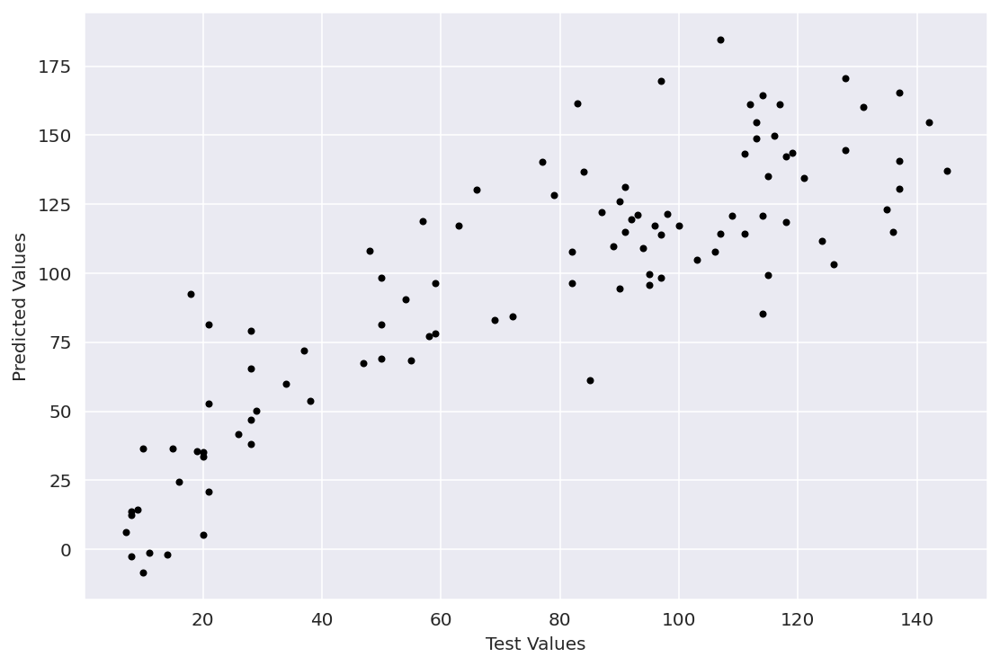

In [12]:
# Here is all the code in one cell with most of it wrapped into a function for reuse

# from sklearn.linear_model import LinearRegression
model_lr = LinearRegression()
model_lr.fit(X_train,y_train) # this could be inside the function below too

def my_regression_results(model):
    score_test = model.score(X_test,y_test)
    print('Model r-squared score from test data: {:0.4f}'.format(score_test))

    y_pred = model.predict(X_test)
    # import matplotlib.pyplot as plt
    plt.figure(figsize=(9,6))
    plt.plot(y_test,y_pred,'k.')
    plt.xlabel('Test Values')
    plt.ylabel('Predicted Values');

    # from sklearn.metrics import mean_squared_error
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mse)
    print('Mean squared error on test data: {:0.2f}'.format(mse))
    print('Root mean squared error on test data: {:0.2f}'.format(rmse))

#write a function to display results in a short list with no visuals.
def my_short_regression_results(model):
    score_test = model.score(X_test,y_test)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test,y_pred)
    rmse = np.sqrt(mse)
    return(score_test, mse, rmse)
    
my_regression_results(model_lr)

In [13]:
round(my_short_regression_results(model_lr)[0], 2)

0.42

Model r-squared score from test data: 0.3258
Mean squared error on test data: 1164.32
Root mean squared error on test data: 34.12


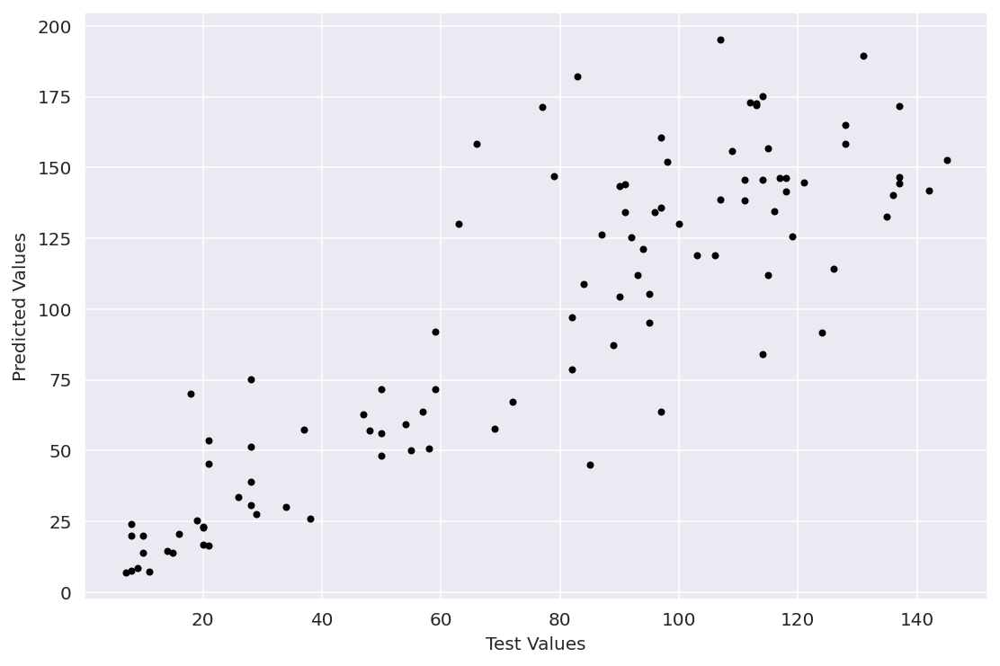

In [14]:
# from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(random_state=0)
rf_model.fit(X_train,y_train)

my_regression_results(rf_model)

Model r-squared score from test data: 0.2148
Mean squared error on test data: 1355.97
Root mean squared error on test data: 36.82


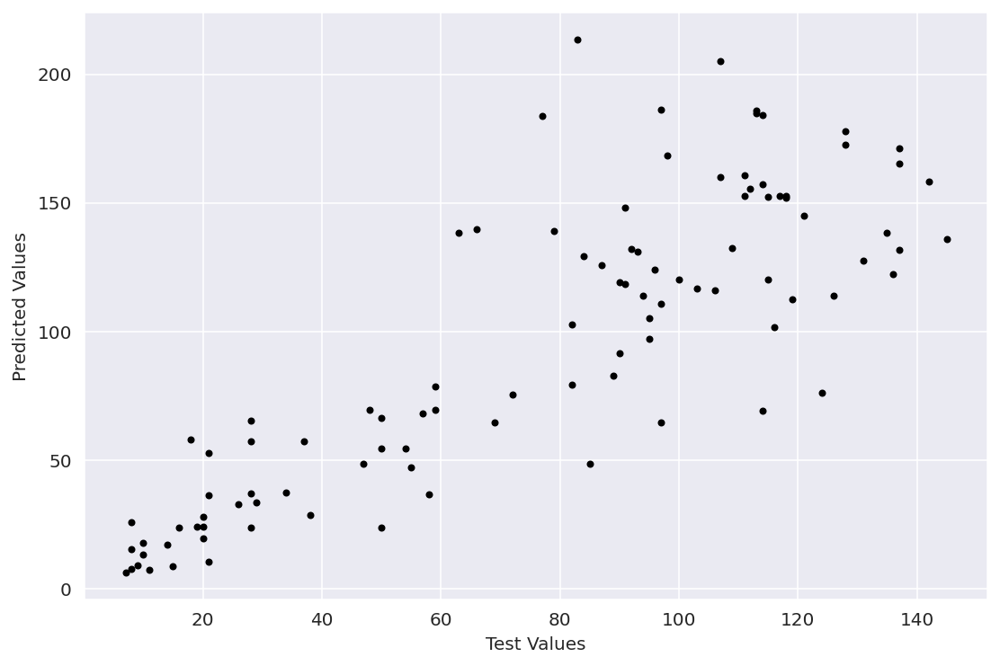

In [15]:
# import xgboost as xgb

xgbr_model = xgb.XGBRegressor(objective ='reg:squarederror')
xgbr_model.fit(X_train,y_train)

my_regression_results(xgbr_model)

### Baseline Model Results

In [16]:
d = {'Algorithm' : ['Linear Regression', 'Random Forest Regression','XGBoost Regression' ]
     ,'Data Transformations':['Basic transformations from EDA','..','..']
     ,'Train R-squared':[round(model_lr.score(X_train,y_train),2),round(rf_model.score(X_train,y_train),2),round(xgbr_model.score(X_train,y_train),2)]
     ,'Test R-squared':[round(my_short_regression_results(model_lr)[0],2),round(my_short_regression_results(rf_model)[0],2),round(my_short_regression_results(xgbr_model)[0],2)]
     ,'Test Mean Squared Error':[round(my_short_regression_results(model_lr)[1],2),round(my_short_regression_results(rf_model)[1],2),round(my_short_regression_results(xgbr_model)[1],2)]
     ,'Test Root Mean Squared Error':[round(my_short_regression_results(model_lr)[2],2),round(my_short_regression_results(rf_model)[2],2),round(my_short_regression_results(xgbr_model)[2],2)]}
df = pd.DataFrame(data=d)
df

,Algorithm,Data Transformations,Train R-squared,Test R-squared,Test Mean Squared Error,Test Root Mean Squared Error
0,Linear Regression,Basic transformations from EDA,0.58,0.42,1004.66,31.70
1,Random Forest Regression,..,0.95,0.33,1164.32,34.12
2,XGBoost Regression,..,0.81,0.21,1355.97,36.82


In [17]:
#export prepared datasets for use in other notebooks. 
X_train.to_csv('x_train.csv')
y_train.to_csv('y_train.csv')
X_test.to_csv('x_test.csv')
y_test.to_csv('y_test.csv')

In [18]:
train = X_train
test = X_test

In [19]:
train.columns

Index(['T24', 'T30', 'T50', 'P30', 'Ps30', 'phi', 'NRc', 'BPR', 'htBleed',
       'W31', 'W32', 'Nf_diff', 'NRf_diff'],
      dtype='object')

In [20]:
#use a feature selection algorithm to choose the most impactful features
from sklearn.feature_selection import RFE
estimator = LinearRegression()
selector = RFE(estimator, n_features_to_select=5, step=1)
selector = selector.fit(train, y_train)
selector.support_

array([False, False, False, False,  True, False, False,  True, False,
        True,  True, False,  True])

In [21]:
#observe ranking of variables by influence
selector.ranking_

array([4, 9, 7, 5, 1, 3, 8, 1, 6, 1, 1, 2, 1])

Model r-squared score from test data: 0.3864
Mean squared error on test data: 1059.54
Root mean squared error on test data: 32.55


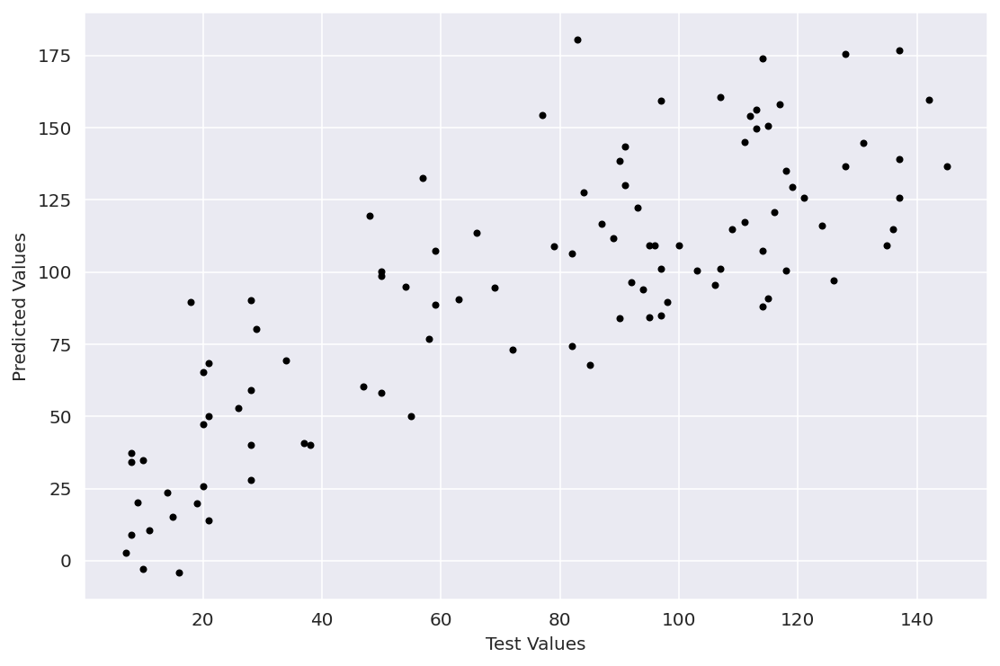

In [22]:
#try stepwise regression writing a function to see if adding more variables matters. 

#def stepwise_regression(train, test):

X_train = train.loc[:,['BPR','W32','Ps30','W31','NRf_diff']]
X_test = test.loc[:,['BPR','W32','Ps30','W31','NRf_diff']]
    
    
model_lr_1= LinearRegression()

# Step 3: fit the model by calling its fit() method
model_lr_1.fit(X_train, y_train)

my_regression_results(model_lr_1)

In [24]:
def stepwise_regression(train,test,y_train,y_test):
    #import features
    import pandas as pd
    import numpy as np
    from sklearn.linear_model import LinearRegression
    from sklearn.metrics import mean_squared_error
    from sklearn.feature_selection import RFE

    train = train
    test = test
    y_train = y_train
    y_test = y_test
    
    cols_boolean = []
    
    estimator = LinearRegression()

    
    d = {'attempt':[],'features':[],'score_train':[], 'score_test':[],'mse':[],'rmse':[]} # set up a dictionary to hold linear regression attempts and results. 
    
    for i in range(1,len(train.columns)):
        selector = RFE(estimator, n_features_to_select = i, step=1)
        selector = selector.fit(train, y_train)
        
        X_train = train.iloc[:, selector.support_]
        X_test = test.iloc[:, selector.support_]
        
        model= LinearRegression()
        
        model.fit(X_train, y_train)
        
        d['attempt'].append(i)
        d['features'].append(list(X_train.columns))
        d['score_train'].append(round(model.score(X_train,y_train),2))
        d['score_test'].append(round(model.score(X_test,y_test),2))
        y_pred= model.predict(X_test)
        mse=mean_squared_error(y_test,y_pred)
        d['mse'].append(round((mse),2))
        d['rmse'].append(round(np.sqrt(mse),2))
    
    df = pd.DataFrame(data=d)

    return(df)

In [25]:
#assess results of stepwise regression
stepwise_regression(train,test,y_train,y_test)

,attempt,features,score_train,score_test,mse,rmse
0,1,[BPR],0.41,0.16,1453.65,38.13
1,2,"[BPR, W32]",0.48,0.34,1137.62,33.73
2,3,"[Ps30, BPR, W32]",0.52,0.37,1080.69,32.87
3,4,"[Ps30, BPR, W32, NRf_diff]",0.52,0.36,1096.71,33.12
4,5,"[Ps30, BPR, W31, W32, NRf_diff]",0.53,0.39,1059.54,32.55
5,6,"[Ps30, BPR, W31, W32, Nf_diff, NRf_diff]",0.53,0.38,1067.36,32.67
6,7,"[Ps30, phi, BPR, W31, W32, Nf_diff, NRf_diff]",0.54,0.35,1124.72,33.54
7,8,"[T24, Ps30, phi, BPR, W31, W32, Nf_diff, NRf_d...",0.55,0.36,1105.59,33.25
8,9,"[T24, P30, Ps30, phi, BPR, W31, W32, Nf_diff, ...",0.55,0.33,1158.01,34.03
9,10,"[T24, P30, Ps30, phi, BPR, htBleed, W31, W32, ...",0.55,0.34,1135.48,33.70


In [26]:
#assess for multicollinearity on different models. 
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
vifs = {train.columns[i]:round(vif(train.values, i), 2) for i in range(len(train.columns))}
display(vifs)

{'T24': 4348883.95,
 'T30': 153593.38,
 'T50': 110936.87,
 'P30': 1666208.59,
 'Ps30': 187096.8,
 'phi': 2572064.6,
 'NRc': 289939.15,
 'BPR': 166072.66,
 'htBleed': 164077.1,
 'W31': 140284.53,
 'W32': 142510.0,
 'Nf_diff': 12.8,
 'NRf_diff': 10124968.75}

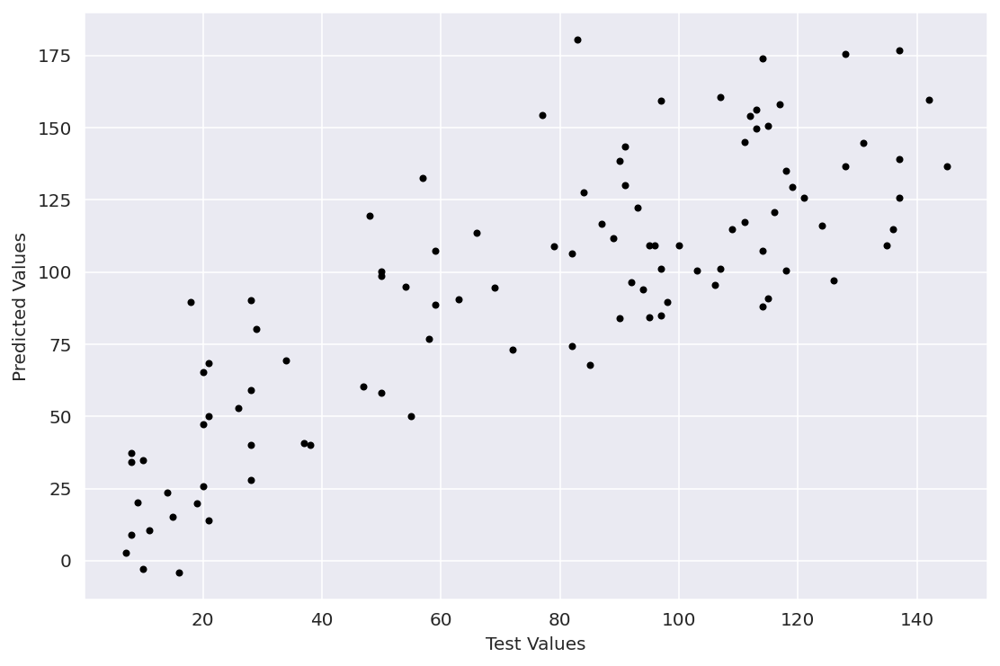

In [29]:
model_lr = LinearRegression()
model_lr.fit(X_train,y_train)

y_pred = model_lr.predict(X_test)
    # import matplotlib.pyplot as plt
plt.figure(figsize=(9,6))
plt.plot(y_test,y_pred,'k.')
plt.xlabel('Test Values')
plt.ylabel('Predicted Values');

In [46]:
#Try to take the log of BPR to create a linear relationship with y. 

train_2 = train[['Ps30','BPR','W32']]

In [47]:
train_2['Ps30_log'] = np.log(train_2['Ps30'])
train_2['BPR_log'] = np.log(train_2['BPR'])
train_2['W32_log'] = np.log(train_2['W32'])

In [48]:
train_2

,Ps30,BPR,W32,Ps30_log,BPR_log,W32_log
0,47.47,8.4195,23.4190,3.860098,2.130550,3.153548
1,47.49,8.4318,23.4236,3.860519,2.132010,3.153744
2,47.27,8.4178,23.3442,3.855876,2.130349,3.150349
3,47.13,8.3682,23.3739,3.852910,2.124439,3.151620
4,47.28,8.4294,23.4044,3.856087,2.131726,3.152924
...,...,...,...,...,...,...
20626,48.07,8.4956,22.9735,3.872658,2.139548,3.134341
20627,48.04,8.5139,23.1594,3.872034,2.141700,3.142401
20628,48.09,8.5646,22.9333,3.873074,2.147637,3.132590
20629,48.39,8.5389,23.0640,3.879293,2.144632,3.138273


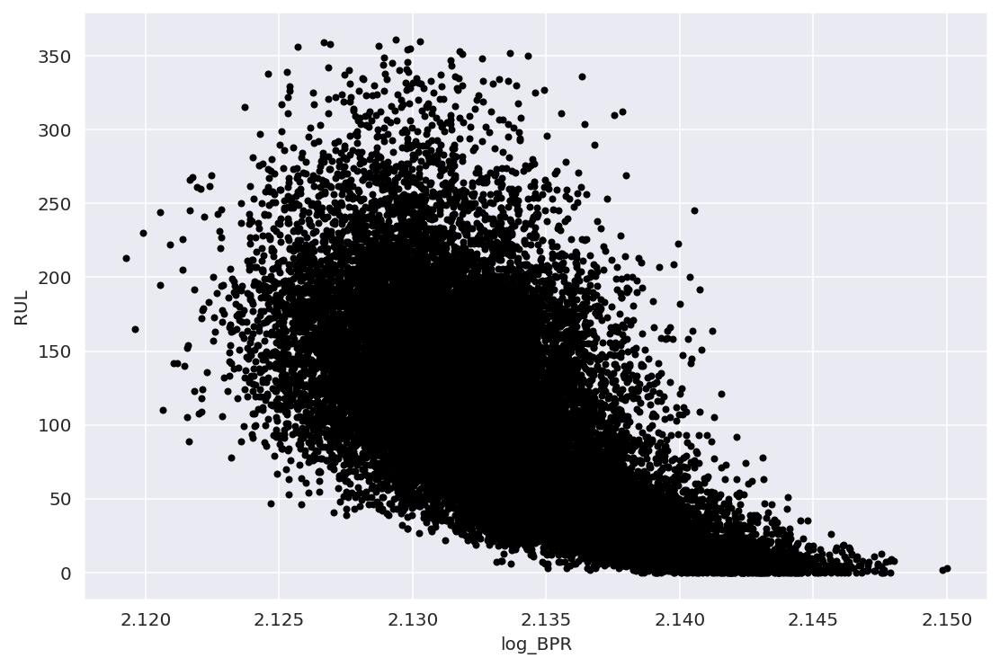

In [49]:
#this doesn't work
plt.figure(figsize=(9,6))
plt.plot(train_2['BPR_log'],y_train,'k.')
plt.xlabel('log_BPR')
plt.ylabel('RUL');

In [50]:
train_2['Ps30_diff'] = train_2['Ps30'].diff()
train_2['BPR_diff'] = train_2['BPR'].diff()
train_2['W32_diff'] = train_2['W32'].diff()

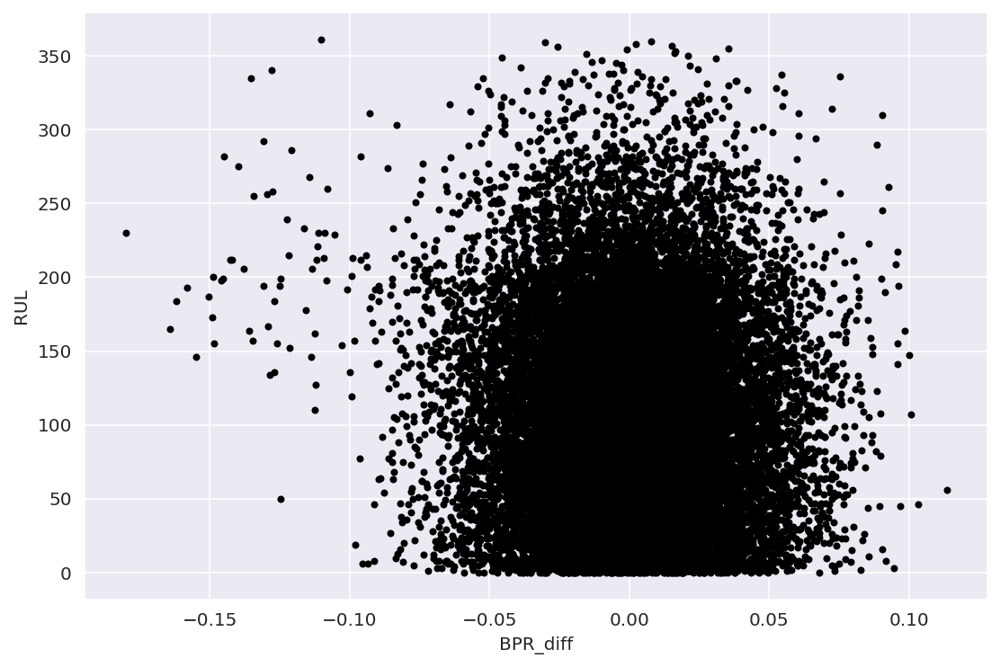

In [51]:
#this also doesn't work
plt.figure(figsize=(9,6))
plt.plot(train_2['BPR_diff'],y_train,'k.')
plt.xlabel('BPR_diff')
plt.ylabel('RUL');

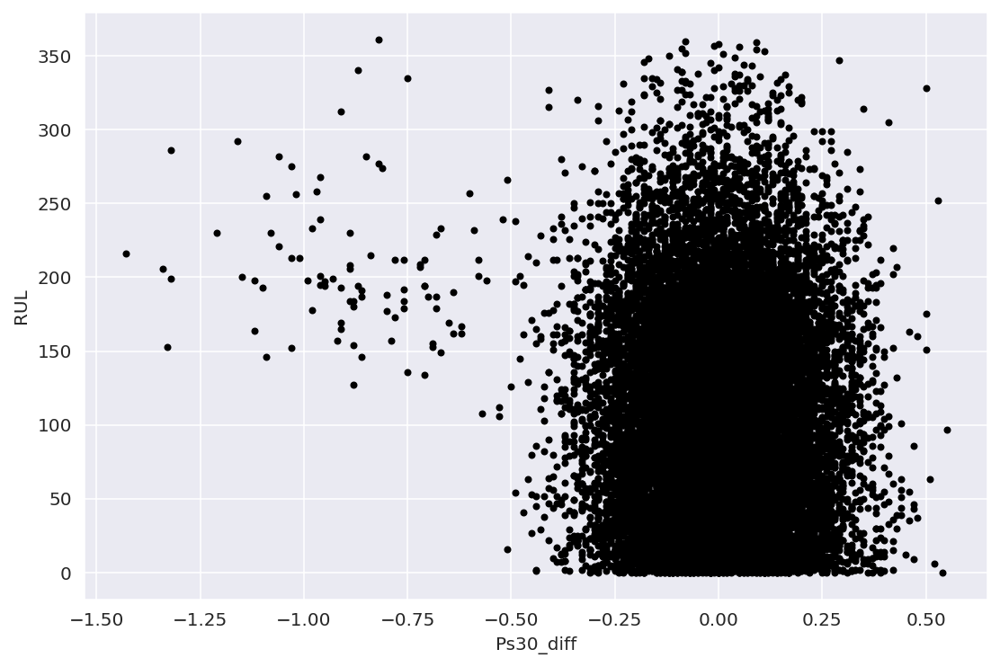

In [52]:
#this also doesn't work
plt.figure(figsize=(9,6))
plt.plot(train_2['Ps30_diff'],y_train,'k.')
plt.xlabel('Ps30_diff')
plt.ylabel('RUL');

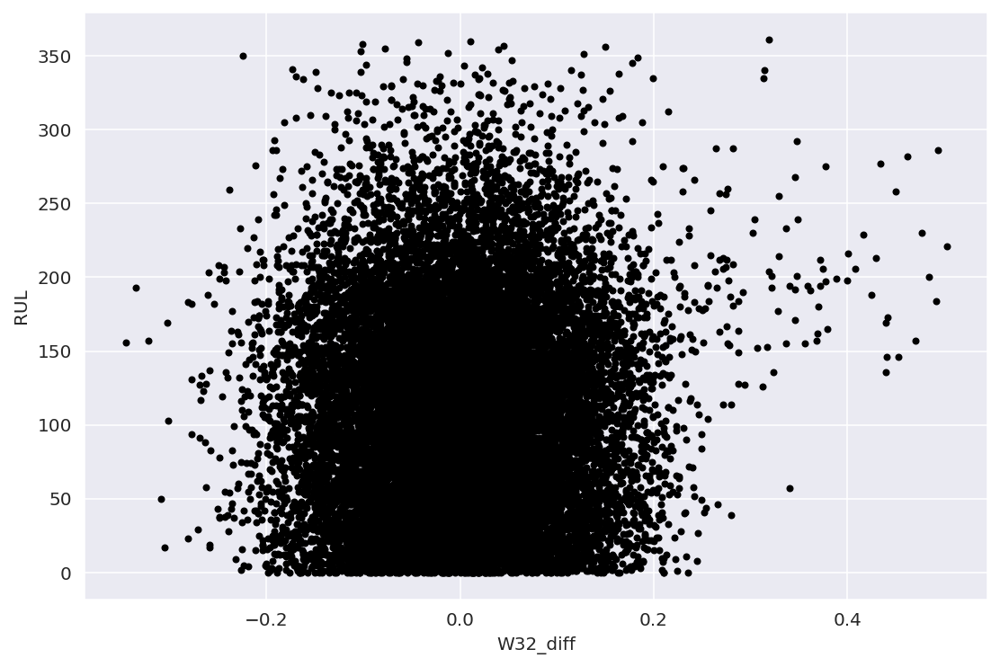

In [53]:
#this also doesn't work
plt.figure(figsize=(9,6))
plt.plot(train_2['W32_diff'],y_train,'k.')
plt.xlabel('W32_diff')
plt.ylabel('RUL');